Music Recommendation System Using Content based

In [45]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
from collections import defaultdict
import difflib

import warnings
warnings.filterwarnings("ignore")

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [46]:
data = pd.read_csv("/content/data.csv")
genre_data = pd.read_csv('/content/data_by_genres.csv')
year_data = pd.read_csv('/content/data_by_year.csv')
artist_data = pd.read_csv('/content/data_by_artist.csv')

In [47]:
tracks.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        24 non-null     int64  
 1   danceability      24 non-null     float64
 2   energy            24 non-null     float64
 3   key               24 non-null     int64  
 4   loudness          24 non-null     float64
 5   mode              24 non-null     int64  
 6   speechiness       24 non-null     float64
 7   acousticness      24 non-null     float64
 8   instrumentalness  24 non-null     float64
 9   liveness          24 non-null     float64
 10  valence           24 non-null     float64
 11  tempo             24 non-null     float64
 12  type              24 non-null     object 
 13  uri               24 non-null     object 
 14  track_href        24 non-null     object 
 15  analysis_url      24 non-null     object 
 16  duration_ms       24 non-null     int64  
 17 

In [48]:
data.head(2)


,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936


In [49]:
genre_data.head(2)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5


In [50]:
year_data.head(2)

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.20571,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.24072,-19.275282,0.116655,100.884521,0.535549,0.140845,10


In [51]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [52]:
data['decade'] = data['year'].apply(lambda year : f'{(year//10)*10}s' )

EDA( Exploratory Data Analysis)

<Axes: xlabel='count', ylabel='decade'>

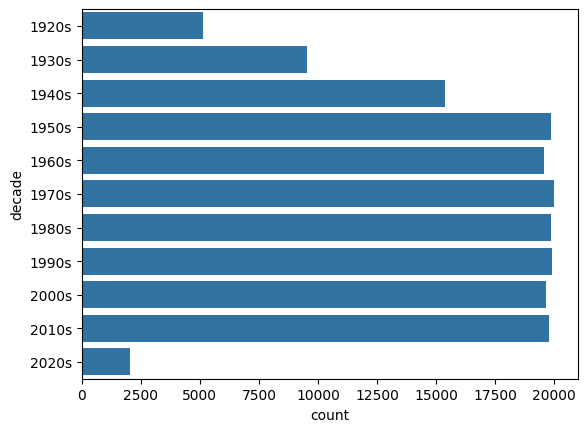

In [53]:
sns.countplot(data['decade'],)

In [54]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features,title='Trend of various sound features over decades')
fig.show()

In [55]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group',
            title='Trend of various sound features over top 10 genres')
fig.show()

In [56]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=12))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [57]:
''' Visualizing the Clusters with t-SNE
 is an unsupervised Machine Learning algorithm.
 It has become widely used in bioinformatics and more generally in data science to visualise the structure of
 high dimensional data in 2 or 3 dimensions.
 While t-SNE is a dimensionality reduction technique, it is mostly used for visualization and not data pre-processing
 (like you might with PCA). For this reason, you almost always reduce the dimensionality down to 2 with t-SNE,
 so that you can then plot the data in two dimensions.
'''
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X) # returns np-array of coordinates(x,y) for each record after TSNE.
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'],title='Clusters of genres')
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.451s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106216
[t-SNE] KL divergence after 1000 iterations: 1.392422


# Visualizing the Clusters with PCA
Prinipal Component Analysis is an unsupervised learning algorithm that is used for the dimensionality reduction in machine learning.
One of the most major differences between PCA and t-SNE is it preserves only local similarities whereas PA preserves
large pairwise distance maximize variance. It takes a set of points in high dimensional data and converts it into low dimensional data.
'''


In [61]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=25,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [62]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'],title='Clusters of songs')
fig.show()

In [63]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.0/252.0 kB 10.6 MB/s eta 0:00:00


In [77]:
!pip install kaggle

In [80]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict




In [81]:
'''
Finds song details from spotify dataset. If song is unavailable in dataset, it returns none.
'''
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [82]:
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

In [83]:
'''
Fetches song info from dataset and does the mean of all numerical features of the song-data.
'''
def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))#nd-array where n is number of songs in list. It contains all numerical vals of songs in sep list.
    #print(f'song_matrix {song_matrix}')
    return np.mean(song_matrix, axis=0) # mean of each ele in list, returns 1-d array

In [84]:
'''
Flattenning the dictionary by grouping the key and forming a list of values for respective key.
'''
def flatten_dict_list(dict_list):
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = [] # 'name', 'year'
    for dic in dict_list:
        for key,value in dic.items():
            flattened_dict[key].append(value) # creating list of values
    return flattened_dict

In [85]:
'''
Gets song list as input.
Get mean vectors of numerical features of the input.
Scale the mean-input as well as dataset numerical features.
calculate eculidean distance b/w mean-input and dataset.
Fetch the top 10 songs with maximum similarity.
'''
def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    #print(f'song_center {song_center}')
    scaler = song_cluster_pipeline.steps[0][1] # StandardScalar()
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    #print(f'distances {distances}')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
recommend_songs([{'name': 'Blinding Lights', 'year': 2019}],  data)

[{'name': 'Best News Ever', 'year': 2017, 'artists': "['MercyMe']"},
 {'name': 'Bit By Bit', 'year': 2012, 'artists': "['Mother Mother']"},

 {'name': 'A Different World (feat. Corey Taylor)',

  'year': 2016,'artists': "['Korn', 'Corey Taylor']"},

 {'name': 'Sober', 'year': 2015, 'artists': "['Selena Gomez']"},

 {'name': "Don't Say Goodnight",
  'year': 2014,
  'artists': "['Hot Chelle Rae']"},

 {'name': 'Sight of the Sun - Single Version',
  'year': 2014,
  'artists': "['fun.']"},

 {'name': 'This Life',
  'year': 2011,
  'artists': "['Curtis Stigers', 'The Forest Rangers']"},

 {'name': 'Re-Do', 'year': 2012, 'artists': "['Modern Baseball']"},
 {'name': 'I Will Follow', 'year': 2010, 'artists': "['Chris Tomlin']"},

 {'name': "Livin' The Dream", 'year': 2016, 'artists': "['Drake White']"}]